# Water availability prediction

* To help preserve the health of these waterbodies it is important to predict the most efficient water availability, in terms of level and water flow for each day of the year.
* The Acea Group deals with four different type of waterbodies: water springs, lakes, rivers and aquifers.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Data description

* This water body consists of two subsystems, that we call NORH and SOUTH, where the former partly influences the behaviour of the latter.
* The levels of the NORTH sector are represented by the values of the SAL, PAG, CoS and DIEC wells, while the levels of the SOUTH sector by the LT2 well.
* Output : Depth_to_Groundwater_SAL, Depth_to_Groundwater_COS, Depth_to_Groundwater_LT2.

**Feature Description**:

1. Date (Daily Date) : Uniquely identifies a day (Primary Key).
2. Rainfall_X (Real Number) : It indicates the quantity of rain falling, expressed in millimeters (mm), in the area X.
3. Depth_to_Groundwater_Y (Real Number) : It indicates the groundwater level, expressed in ground level (meters from the ground floor), detected by the piezometer Y.
4. Temperature_Z (Real Number) : It indicates the temperature, expressed in °C, detected by the thermometric station Z.
5. Volume_H (Real Number) : It indicates the volume of water, expressed in cubic meters (mc), taken from the drinking water treatment plant H.
6. Hydrometry_K (Real Number): It indicates the groundwater level, expressed in meters (m), detected by the hydrometric station K.

**Code**:

* X : Gallicano, Pontetetto, Monte_Serra, Orentano, Borgo_a_Mozzano, Piaggione, Calavorno, Croce_Arcana, Tereglio_Coreglia_Antelminelli, Fabbriche_di_Vallico.
* Y : LT2, SAL, PAG, CoS, DIEC.
* Z : Orentano, Monte_Serra, Ponte_a_Moriano, Lucca_Orto_Botanico.
* H : POL, CC1, CC2, CSA, CSAL.
* K : Monte_S_Quirico, Piaggione.

## Exploratory Data Analysis

In [2]:
col_date = ['Date']
auser = pd.read_csv("Aquifer_Auser.csv", parse_dates=col_date)
auser

,Date,Rainfall_Gallicano,Rainfall_Pontetetto,Rainfall_Monte_Serra,Rainfall_Orentano,Rainfall_Borgo_a_Mozzano,Rainfall_Piaggione,Rainfall_Calavorno,Rainfall_Croce_Arcana,Rainfall_Tereglio_Coreglia_Antelminelli,...,Temperature_Monte_Serra,Temperature_Ponte_a_Moriano,Temperature_Lucca_Orto_Botanico,Volume_POL,Volume_CC1,Volume_CC2,Volume_CSA,Volume_CSAL,Hydrometry_Monte_S_Quirico,Hydrometry_Piaggione
0,1998-05-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.00,0.0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1998-06-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.00,0.0,10.05,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1998-07-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,9.20,0.0,10.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1998-08-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,11.40,0.0,13.85,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1998-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,11.40,0.0,12.85,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8149,2020-06-26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,20.75,0.0,23.75,-7189.406533,-7847.900,-9183.433333,-6115.40,-3158.0,0.20,-1.03
8150,2020-06-27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,21.35,0.0,24.30,-7189.406533,-7847.900,-9183.433333,-6115.40,-3158.0,0.21,-1.03
8151,2020-06-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,21.75,0.0,24.55,-6829.936207,-7455.505,-8724.261667,-5809.63,-3000.1,0.23,-1.03
8152,2020-06-29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,18.90,0.0,23.60,-7189.406533,-7847.900,-9183.433333,-6115.40,-3158.0,0.23,-1.02


In [3]:
auser.isna().sum() * 100/len(auser)

Date                                        0.000000
Rainfall_Gallicano                         35.062546
Rainfall_Pontetetto                        35.062546
Rainfall_Monte_Serra                       35.136130
Rainfall_Orentano                          35.062546
Rainfall_Borgo_a_Mozzano                   35.062546
Rainfall_Piaggione                         39.538877
Rainfall_Calavorno                         35.062546
Rainfall_Croce_Arcana                      35.062546
Rainfall_Tereglio_Coreglia_Antelminelli    35.062546
Rainfall_Fabbriche_di_Vallico              35.062546
Depth_to_Groundwater_LT2                   41.108658
Depth_to_Groundwater_SAL                   44.260486
Depth_to_Groundwater_PAG                   53.311258
Depth_to_Groundwater_CoS                   47.081187
Depth_to_Groundwater_DIEC                  59.896983
Temperature_Orentano                        0.000000
Temperature_Monte_Serra                     0.000000
Temperature_Ponte_a_Moriano                 0.

As we can see only date and temperature features don't have any missing value......

In [4]:
cols_float = ['Rainfall_Gallicano', 'Rainfall_Pontetetto',
       'Rainfall_Monte_Serra', 'Rainfall_Orentano', 'Rainfall_Borgo_a_Mozzano',
       'Rainfall_Piaggione', 'Rainfall_Calavorno', 'Rainfall_Croce_Arcana',
       'Rainfall_Tereglio_Coreglia_Antelminelli',
       'Rainfall_Fabbriche_di_Vallico', 'Depth_to_Groundwater_LT2',
       'Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_PAG',
       'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_DIEC',
       'Temperature_Orentano', 'Temperature_Monte_Serra',
       'Temperature_Ponte_a_Moriano', 'Temperature_Lucca_Orto_Botanico',
       'Volume_POL', 'Volume_CC1', 'Volume_CC2', 'Volume_CSA', 'Volume_CSAL',
       'Hydrometry_Monte_S_Quirico', 'Hydrometry_Piaggione']
auser[cols_float] = auser[cols_float].astype('float32')
auser.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8154 entries, 0 to 8153
Data columns (total 27 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Date                                     8154 non-null   datetime64[ns]
 1   Rainfall_Gallicano                       5295 non-null   float32       
 2   Rainfall_Pontetetto                      5295 non-null   float32       
 3   Rainfall_Monte_Serra                     5289 non-null   float32       
 4   Rainfall_Orentano                        5295 non-null   float32       
 5   Rainfall_Borgo_a_Mozzano                 5295 non-null   float32       
 6   Rainfall_Piaggione                       4930 non-null   float32       
 7   Rainfall_Calavorno                       5295 non-null   float32       
 8   Rainfall_Croce_Arcana                    5295 non-null   float32       
 9   Rainfall_Tereglio_Coreglia_Antelminelli  

In [5]:
auser['Rainfall_Borgo_a_Mozzano'][4000:4030]

4000     0.000000
4001     0.000000
4002     0.000000
4003     0.000000
4004     0.000000
4005     0.000000
4006     0.000000
4007     0.000000
4008     0.000000
4009     0.000000
4010     0.200000
4011     0.000000
4012     0.000000
4013     0.000000
4014     0.800000
4015     8.800000
4016     1.000000
4017    19.799999
4018    53.799999
4019    16.200001
4020     0.000000
4021     0.000000
4022     0.000000
4023     0.000000
4024     0.400000
4025     0.200000
4026     0.000000
4027     0.000000
4028     0.000000
4029     0.000000
Name: Rainfall_Borgo_a_Mozzano, dtype: float32

### Correlation matrix

In [6]:
def corr_to_target(dataframe, target, title=None, file=None):
    plt.figure(figsize=(6,12))
    sns.set(font_scale=1)
    
    sns.heatmap(dataframe.corr()[[target]].sort_values(target, ascending=False),
               annot=True, cmap='coolwarm')
    
    if title: plt.title(f'\n{title}\n', fontsize=18)
    plt.xlabel('')
    plt.ylabel('')
    if file: plt.savefig(file, bbox_inches='tight')
    plt.show();

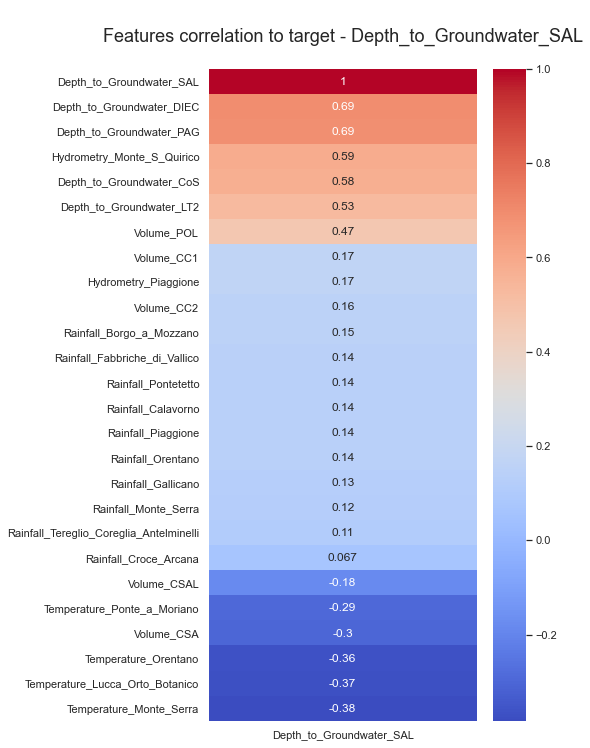

In [7]:
corr_to_target(auser, 'Depth_to_Groundwater_SAL', 'Features correlation to target - Depth_to_Groundwater_SAL')

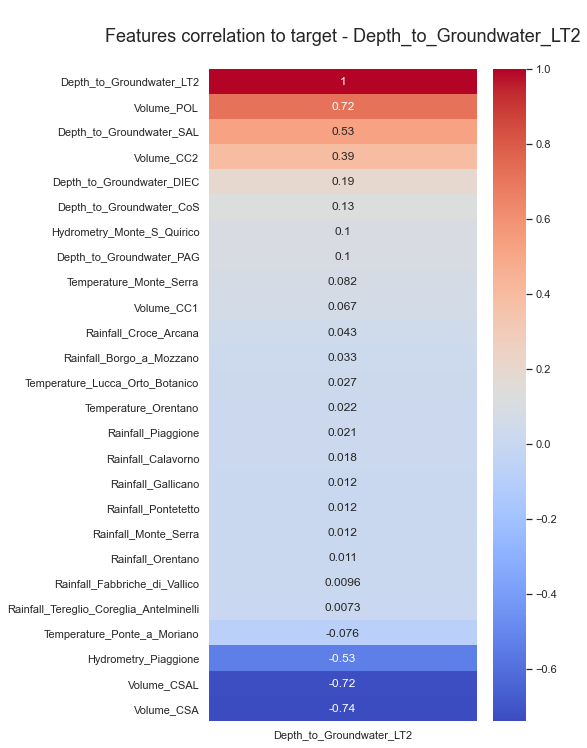

In [8]:
corr_to_target(auser, 'Depth_to_Groundwater_LT2', 'Features correlation to target - Depth_to_Groundwater_LT2')

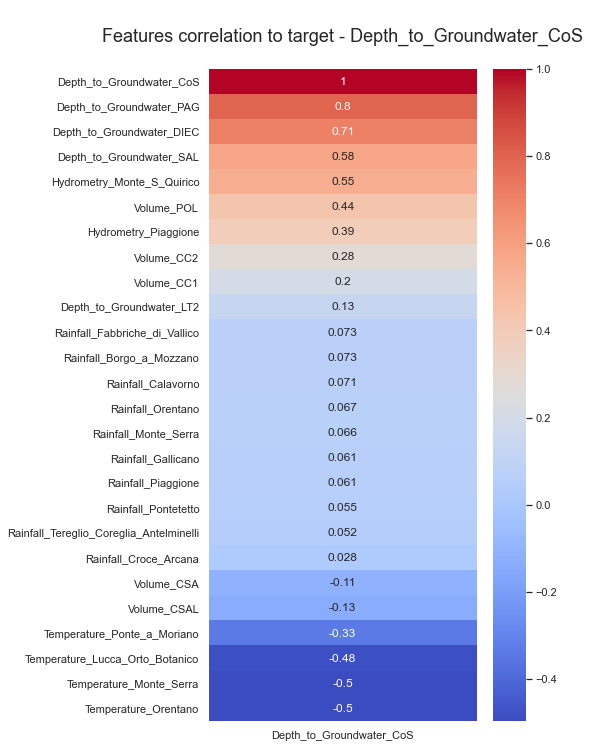

In [9]:
corr_to_target(auser, 'Depth_to_Groundwater_CoS', 'Features correlation to target - Depth_to_Groundwater_CoS')

In [10]:
auser.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8154 entries, 0 to 8153
Data columns (total 27 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Date                                     8154 non-null   datetime64[ns]
 1   Rainfall_Gallicano                       5295 non-null   float32       
 2   Rainfall_Pontetetto                      5295 non-null   float32       
 3   Rainfall_Monte_Serra                     5289 non-null   float32       
 4   Rainfall_Orentano                        5295 non-null   float32       
 5   Rainfall_Borgo_a_Mozzano                 5295 non-null   float32       
 6   Rainfall_Piaggione                       4930 non-null   float32       
 7   Rainfall_Calavorno                       5295 non-null   float32       
 8   Rainfall_Croce_Arcana                    5295 non-null   float32       
 9   Rainfall_Tereglio_Coreglia_Antelminelli  

The number of missing data is so high, let's see all of it in data frame.....

In [11]:
auser[auser.isnull().values.any(axis=1)].T

,0,1,2,3,4,5,6,7,8,9,...,8059,8060,8061,8062,8063,8064,8065,8066,8067,8097
Date,1998-05-03 00:00:00,1998-06-03 00:00:00,1998-07-03 00:00:00,1998-08-03 00:00:00,1998-09-03 00:00:00,1998-10-03 00:00:00,1998-11-03 00:00:00,1998-12-03 00:00:00,1998-03-13 00:00:00,1998-03-14 00:00:00,...,2020-03-28 00:00:00,2020-03-29 00:00:00,2020-03-30 00:00:00,2020-03-31 00:00:00,2020-01-04 00:00:00,2020-02-04 00:00:00,2020-03-04 00:00:00,2020-04-04 00:00:00,2020-05-04 00:00:00,2020-05-05 00:00:00
Rainfall_Gallicano,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,1.4,1.4,0.0,0.0,0.0,0.0,0.0,0.0
Rainfall_Pontetetto,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0
Rainfall_Monte_Serra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,8.2,0.0,0.0,0.0,0.0,0.0,0.0
Rainfall_Orentano,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0
Rainfall_Borgo_a_Mozzano,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.6,0.0,0.0,0.0,0.0,0.0,0.0
Rainfall_Piaggione,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.6,0.0,0.0,0.0,0.0,0.0,0.0
Rainfall_Calavorno,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,1.2,0.0,0.0,0.0,0.0,0.0,0.0
Rainfall_Croce_Arcana,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,6.8,1.8,0.2,0.0,0.0,0.0,0.0,0.0
Rainfall_Tereglio_Coreglia_Antelminelli,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [12]:
len(auser)

8154

### Sort data by date column

In [13]:
auser.sort_values(by=['Date'], ascending=True, inplace=True, ignore_index=True)
auser

,Date,Rainfall_Gallicano,Rainfall_Pontetetto,Rainfall_Monte_Serra,Rainfall_Orentano,Rainfall_Borgo_a_Mozzano,Rainfall_Piaggione,Rainfall_Calavorno,Rainfall_Croce_Arcana,Rainfall_Tereglio_Coreglia_Antelminelli,...,Temperature_Monte_Serra,Temperature_Ponte_a_Moriano,Temperature_Lucca_Orto_Botanico,Volume_POL,Volume_CC1,Volume_CC2,Volume_CSA,Volume_CSAL,Hydrometry_Monte_S_Quirico,Hydrometry_Piaggione
0,1998-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,13.600000,0.0,12.900000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1998-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,11.000000,0.0,13.300000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1998-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,15.550000,0.0,20.799999,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1998-01-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,22.549999,0.0,26.750000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1998-01-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,23.400000,0.0,27.200001,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8149,2020-12-02,0.0,0.0,0.0,0.2,0.000000,0.000000,0.0,0.0,0.000000,...,6.150000,0.0,10.650000,-5562.964355,-11337.069336,-6033.931152,-5973.758789,-3521.931152,0.39,-0.93
8150,2020-12-03,0.0,1.4,5.0,1.4,0.000000,0.200000,0.0,0.0,0.000000,...,6.950000,0.0,8.850000,-5233.504883,-11437.290039,-5862.419434,-5881.935547,-2969.774170,0.50,-0.71
8151,2020-12-04,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,...,13.550000,0.0,13.650000,-4958.992676,-9384.542969,-6700.474609,-5680.271484,-2573.645020,0.19,-0.96
8152,2020-12-05,22.0,13.6,31.0,10.8,25.799999,24.200001,24.0,2.8,17.200001,...,12.050000,0.0,18.450001,-6399.205566,-7526.096680,-7677.258301,-5863.290527,-2923.774170,0.38,-0.86


### Visualize time-series data in lineplot

In [14]:
import plotly.express as px

fig = px.line(auser, x='Date', y='Rainfall_Croce_Arcana', title='Rainfall_Croce_Arcana with slider')

fig.update_xaxes(
        rangeslider_visible=True,
        rangeselector=dict(
            buttons=list([
                dict(count=1, label='1y', step='year', stepmode='backward'),
                dict(count=2, label='2y', step='year', stepmode='backward'),
                dict(count=3, label='3y', step='year', stepmode='backward'),
                dict(step="all")
            ])
        )
)
fig.show()

In [15]:
def lineplot_slider(y, title):
    fig = px.line(auser, x='Date', y=y, title=title)

    fig.update_xaxes(
        rangeslider_visible=True,
        rangeselector=dict(
            buttons=list([
                dict(count=1, label='1y', step='year', stepmode='backward'),
                dict(count=2, label='2y', step='year', stepmode='backward'),
                dict(count=3, label='3y', step='year', stepmode='backward'),
                dict(step="all")
                ])
            )
    )
    fig.show()

In [16]:
lineplot_slider("Rainfall_Borgo_a_Mozzano", "Rainfall_Borgo_a_Mozzano")

In [17]:
lineplot_slider("Volume_POL", "Volume_POL")

In [18]:
lineplot_slider("Temperature_Lucca_Orto_Botanico", "Temperature_Lucca_Orto_Botanico")

In [19]:
lineplot_slider("Hydrometry_Monte_S_Quirico", "Hydrometry_Monte_S_Quirico")

In [20]:
auser.interpolate(limit_direction='both', inplace=True)

In [21]:
lineplot_slider("Rainfall_Borgo_a_Mozzano", "Rainfall_Borgo_a_Mozzano")

In [22]:
lineplot_slider("Volume_POL", "Volume_POL")

In [23]:
lineplot_slider("Hydrometry_Monte_S_Quirico", "Hydrometry_Monte_S_Quirico")

In [24]:
lineplot_slider("Depth_to_Groundwater_SAL", "Depth_to_Groundwater_SAL")

In [25]:
auser.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8154 entries, 0 to 8153
Data columns (total 27 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Date                                     8154 non-null   datetime64[ns]
 1   Rainfall_Gallicano                       8154 non-null   float32       
 2   Rainfall_Pontetetto                      8154 non-null   float32       
 3   Rainfall_Monte_Serra                     8154 non-null   float32       
 4   Rainfall_Orentano                        8154 non-null   float32       
 5   Rainfall_Borgo_a_Mozzano                 8154 non-null   float32       
 6   Rainfall_Piaggione                       8154 non-null   float32       
 7   Rainfall_Calavorno                       8154 non-null   float32       
 8   Rainfall_Croce_Arcana                    8154 non-null   float32       
 9   Rainfall_Tereglio_Coreglia_Antelminelli  

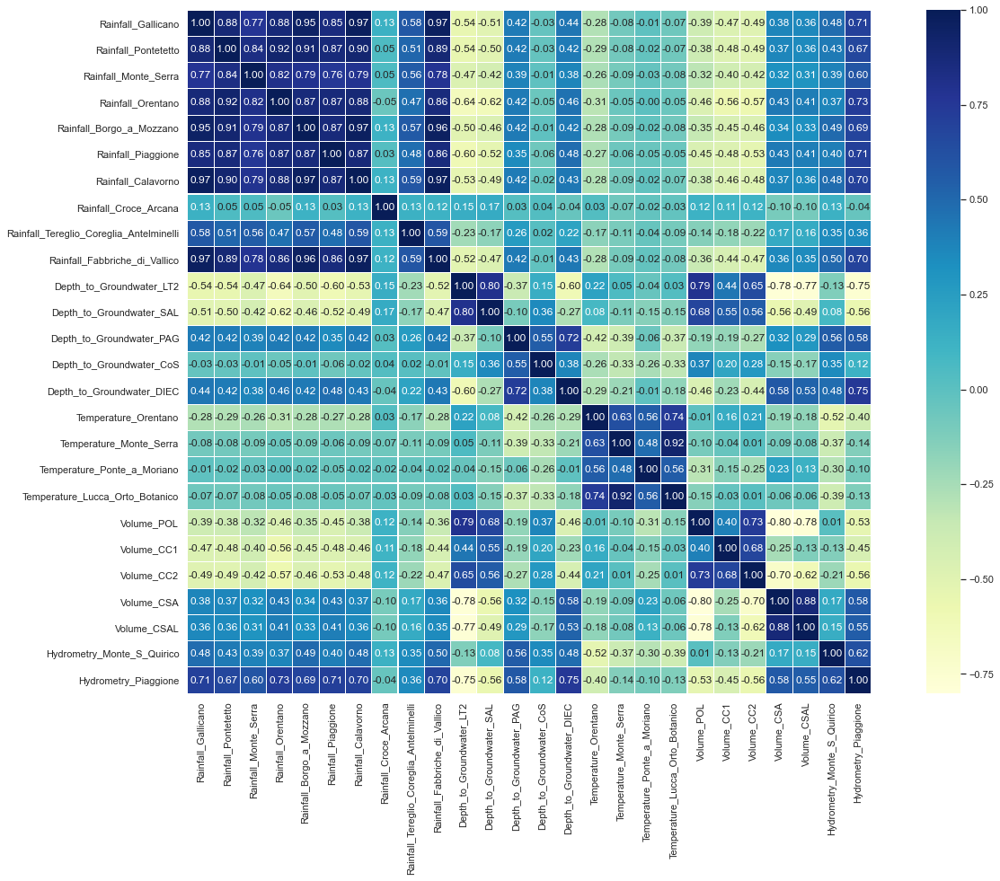

In [26]:
corr_mat = auser.corr()
fig, ax = plt.subplots(figsize=(22,14))
ax = sns.heatmap(corr_mat, annot=True, linewidths=0.1, fmt=".2f", cmap="YlGnBu", square=True);

### Visualize using pivot table

In [27]:
auser['year'] = auser.Date.dt.year
auser['month'] = auser.Date.dt.month
auser['day'] = auser.Date.dt.day
auser['dayofweek'] = auser.Date.dt.dayofweek
auser['dayofyear'] = auser.Date.dt.dayofyear
auser['weekday'] = auser.Date.dt.weekday
cols_date = ['year', 'month', 'day', 'weekday', 'dayofweek', 'dayofyear']
auser[cols_date] = auser[cols_date].astype('int32')
auser.index = auser['Date']
del auser['Date']
auser.reset_index(drop=True, inplace=True)
auser

,Rainfall_Gallicano,Rainfall_Pontetetto,Rainfall_Monte_Serra,Rainfall_Orentano,Rainfall_Borgo_a_Mozzano,Rainfall_Piaggione,Rainfall_Calavorno,Rainfall_Croce_Arcana,Rainfall_Tereglio_Coreglia_Antelminelli,Rainfall_Fabbriche_di_Vallico,...,Volume_CSA,Volume_CSAL,Hydrometry_Monte_S_Quirico,Hydrometry_Piaggione,year,month,day,dayofweek,dayofyear,weekday
0,37.200001,26.0,21.4,43.200001,29.400000,35.200001,31.200001,0.0,11.200000,38.000000,...,0.000000,0.000000,0.63,1.37,1998,1,4,6,4,6
1,37.200001,26.0,21.4,43.200001,29.400000,35.200001,31.200001,0.0,11.200000,38.000000,...,0.000000,0.000000,0.63,1.37,1998,1,5,0,5,0
2,37.200001,26.0,21.4,43.200001,29.400000,35.200001,31.200001,0.0,11.200000,38.000000,...,0.000000,0.000000,0.63,1.37,1998,1,6,1,6,1
3,37.200001,26.0,21.4,43.200001,29.400000,35.200001,31.200001,0.0,11.200000,38.000000,...,0.000000,0.000000,0.63,1.37,1998,1,7,2,7,2
4,37.200001,26.0,21.4,43.200001,29.400000,35.200001,31.200001,0.0,11.200000,38.000000,...,0.000000,0.000000,0.63,1.37,1998,1,8,3,8,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8149,0.000000,0.0,0.0,0.200000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,-5973.758789,-3521.931152,0.39,-0.93,2020,12,2,2,337,2
8150,0.000000,1.4,5.0,1.400000,0.000000,0.200000,0.000000,0.0,0.000000,0.000000,...,-5881.935547,-2969.774170,0.50,-0.71,2020,12,3,3,338,3
8151,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,-5680.271484,-2573.645020,0.19,-0.96,2020,12,4,4,339,4
8152,22.000000,13.6,31.0,10.800000,25.799999,24.200001,24.000000,2.8,17.200001,36.200001,...,-5863.290527,-2923.774170,0.38,-0.86,2020,12,5,5,340,5


In [28]:
auser.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8154 entries, 0 to 8153
Data columns (total 32 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Rainfall_Gallicano                       8154 non-null   float32
 1   Rainfall_Pontetetto                      8154 non-null   float32
 2   Rainfall_Monte_Serra                     8154 non-null   float32
 3   Rainfall_Orentano                        8154 non-null   float32
 4   Rainfall_Borgo_a_Mozzano                 8154 non-null   float32
 5   Rainfall_Piaggione                       8154 non-null   float32
 6   Rainfall_Calavorno                       8154 non-null   float32
 7   Rainfall_Croce_Arcana                    8154 non-null   float32
 8   Rainfall_Tereglio_Coreglia_Antelminelli  8154 non-null   float32
 9   Rainfall_Fabbriche_di_Vallico            8154 non-null   float32
 10  Depth_to_Groundwater_LT2                 8154 no

In [29]:
import calendar

In [30]:
def pivot_heatmap(target_column, title):
    all_month_year_df = pd.pivot_table(auser, values=target_column,
                                       index=["month"],
                                       columns=["year"],
                                       fill_value=0,
                                       margins=True)
    named_index = [[calendar.month_abbr[i] if isinstance(i, int) else i for i in list(all_month_year_df.index)]]
    all_month_year_df = all_month_year_df.set_index(named_index)
    all_month_year_df
    plt.figure(figsize=(19, 10))
    ax = sns.heatmap(all_month_year_df, cmap='RdYlGn_r', robust=True, fmt='.2f', annot=True, linewidths=.5, 
                     annot_kws={'size':10}, cbar_kws={'shrink':.8, 'label': target_column})
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=9)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=9)
    plt.title(title, fontdict={'fontsize':18}, pad=14);

In [31]:
auser.columns

Index(['Rainfall_Gallicano', 'Rainfall_Pontetetto', 'Rainfall_Monte_Serra',
       'Rainfall_Orentano', 'Rainfall_Borgo_a_Mozzano', 'Rainfall_Piaggione',
       'Rainfall_Calavorno', 'Rainfall_Croce_Arcana',
       'Rainfall_Tereglio_Coreglia_Antelminelli',
       'Rainfall_Fabbriche_di_Vallico', 'Depth_to_Groundwater_LT2',
       'Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_PAG',
       'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_DIEC',
       'Temperature_Orentano', 'Temperature_Monte_Serra',
       'Temperature_Ponte_a_Moriano', 'Temperature_Lucca_Orto_Botanico',
       'Volume_POL', 'Volume_CC1', 'Volume_CC2', 'Volume_CSA', 'Volume_CSAL',
       'Hydrometry_Monte_S_Quirico', 'Hydrometry_Piaggione', 'year', 'month',
       'day', 'dayofweek', 'dayofyear', 'weekday'],
      dtype='object')

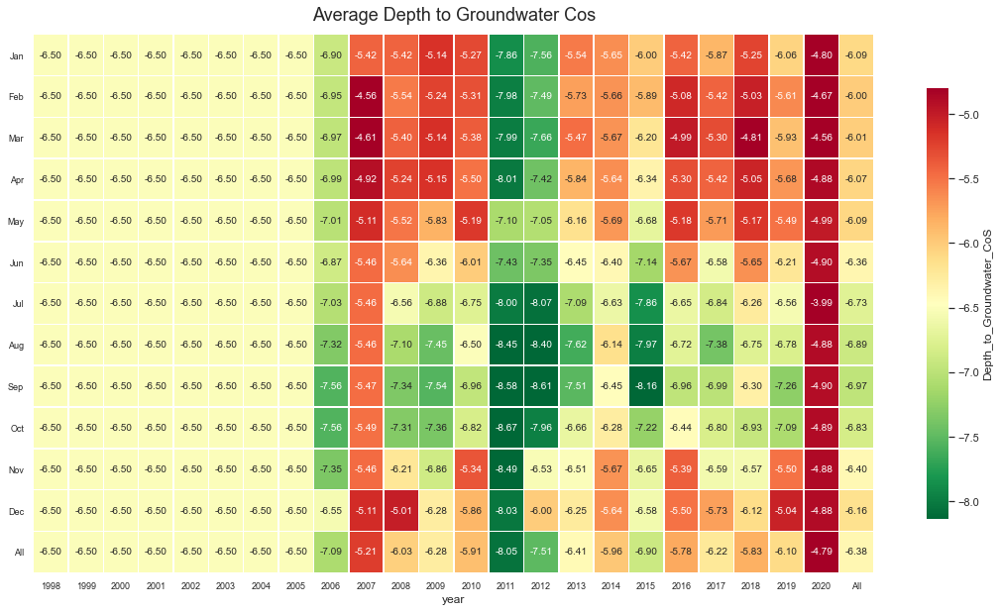

In [32]:
pivot_heatmap('Depth_to_Groundwater_CoS', 'Average Depth to Groundwater Cos')

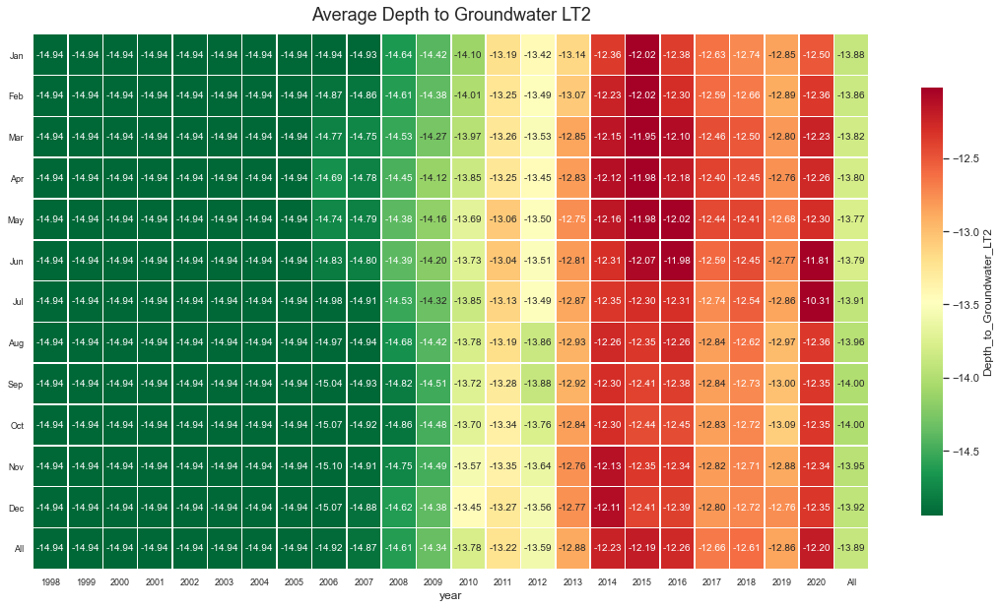

In [33]:
pivot_heatmap("Depth_to_Groundwater_LT2", "Average Depth to Groundwater LT2")

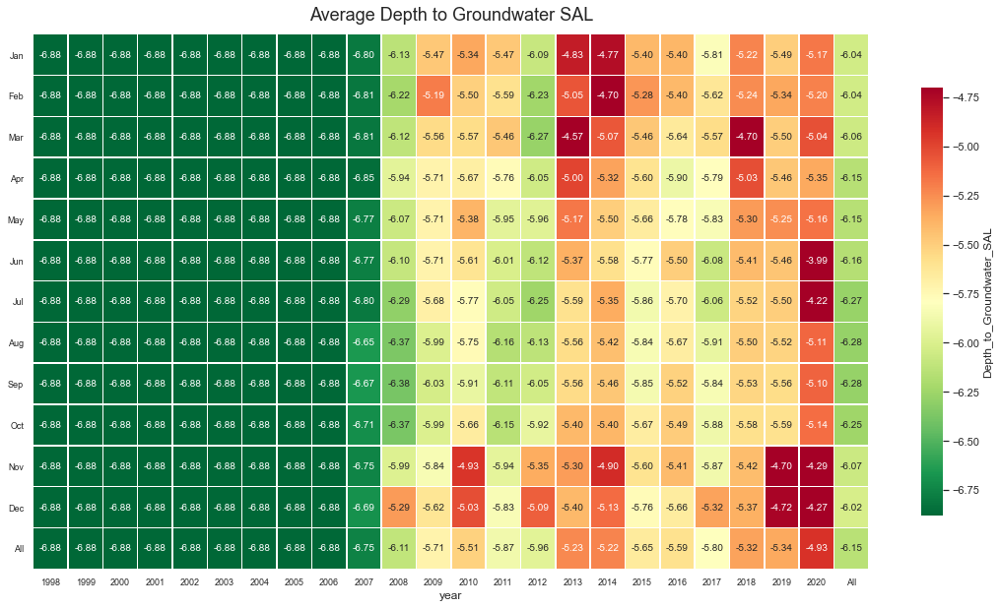

In [34]:
pivot_heatmap('Depth_to_Groundwater_SAL', "Average Depth to Groundwater SAL")

## Modelling

We have 3 target column to predict : `Depth_to_Groundwater_SAL`, `Depth_to_Groundwater_COS`, `Depth_to_Groundwater_LT2`. First, we need to separate features and target column. Second, we need to test our data on three different model, so we can compare it. Last, we can tune hyperparameters and evaluate the models.

### Predict `Depth_to_Groundwater_SAL`

In [35]:
from sklearn.model_selection import train_test_split

def create_train_test_sets(target):
    X = auser.drop(columns=[target], axis=1)
    y = auser[target]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
    return X_train, X_test, y_train, y_test

In [36]:
X_tr1, X_ts1, y_tr1, y_ts1 = create_train_test_sets("Depth_to_Groundwater_SAL")

In [37]:
X_tr1.shape, X_ts1.shape, y_tr1.shape, y_ts1.shape

((6115, 31), (2039, 31), (6115,), (2039,))

In [38]:
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor

models = {
    "Elastic Net": ElasticNet(),
    "Ridge": Ridge(),
    "Random Forest": RandomForestRegressor()
}

# make function for fit and score model
def fit_score(models, X_train, X_test, y_train, y_test):
    """
    Fits and evaluate ML models.
    """
    model_scores = {}
    for name, model in models.items():
        np.random.seed(42)
        model.fit(X_train, y_train)
        model_scores[name] = model.score(X_test, y_test)
    return model_scores

In [39]:
model_result = fit_score(models, X_tr1, X_ts1, y_tr1, y_ts1)
model_result

{'Elastic Net': 0.6489627065851584,
 'Ridge': 0.8711149105961239,
 'Random Forest': 0.965715183671454}

In [40]:
from sklearn.model_selection import RandomizedSearchCV

# different RandomForestRegressor hyperparameter
rf_grid = {
    "n_estimators": np.arange(10,100,10),
    "max_depth": [None, 3,5,10],
    "min_samples_split": np.arange(2,20,2),
    "min_samples_leaf": np.arange(1,20,2),
    "max_features": [0.5, 1, "sqrt", "auto"]
}

# instantiate RandomizedSearchCV
rs_model = RandomizedSearchCV(estimator=RandomForestRegressor(random_state=42),
                             param_distributions=rf_grid,
                             cv=5,
                             verbose=True,
                             n_iter=20)

# fit the RandmizedSearchCV
rs_model.fit(X_tr1, y_tr1)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
                   n_iter=20,
                   param_distributions={'max_depth': [None, 3, 5, 10],
                                        'max_features': [0.5, 1, 'sqrt',
                                                         'auto'],
                                        'min_samples_leaf': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19]),
                                        'min_samples_split': array([ 2,  4,  6,  8, 10, 12, 14, 16, 18]),
                                        'n_estimators': array([10, 20, 30, 40, 50, 60, 70, 80, 90])},
                   verbose=True)

In [41]:
RS_rfr = RandomForestRegressor(random_state=42, **rs_model.best_params_)
RS_rfr.fit(X_tr1, y_tr1)

RandomForestRegressor(max_features=0.5, min_samples_leaf=3,
                      min_samples_split=18, n_estimators=90, random_state=42)

In [42]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score

def evaluate_test(model, X_test, y_test):
    test_preds = model.predict(X_test)
    test_scores = {
        "Mean Squared Error": mean_squared_error(y_test, test_preds),
        "Root Mean Squared Error": np.sqrt(mean_squared_error(y_test, test_preds)),
        "Mean Absolute Error": mean_absolute_error(y_test, test_preds),
        "R2 Score": r2_score(y_test, test_preds),
        "Explained Variance Score": explained_variance_score(y_test, test_preds)
    }
    return test_scores

In [43]:
RS_eval = evaluate_test(RS_rfr, X_ts1, y_ts1)
RS_eval

{'Mean Squared Error': 0.022429178121896702,
 'Root Mean Squared Error': 0.14976374101195758,
 'Mean Absolute Error': 0.0534589837839963,
 'R2 Score': 0.9644945441268087,
 'Explained Variance Score': 0.9644962544536274}

In [44]:
test_preds = RS_rfr.predict(X_ts1)
rfr_compare = pd.DataFrame(data={
    "Actual values": y_ts1,
    "Predict values": test_preds
})
rfr_compare['differences'] = rfr_compare['Predict values'] - rfr_compare['Actual values']
rfr_compare

,Actual values,Predict values,differences
4342,-5.29,-5.351237,-0.061237
1203,-6.88,-6.880000,0.000000
7127,-6.11,-6.034781,0.075219
1758,-6.88,-6.880000,0.000000
927,-6.88,-6.880000,0.000000
...,...,...,...
1444,-6.88,-6.880000,0.000000
1652,-6.88,-6.880000,0.000000
1586,-6.88,-6.880000,0.000000
6446,-5.71,-5.617429,0.092571


### Predict `Depth_to_Groundwater_LT2`

In [45]:
X_tr2, X_ts2, y_tr2, y_ts2 = create_train_test_sets("Depth_to_Groundwater_LT2")
X_tr2.shape, X_ts2.shape, y_tr2.shape, y_ts2.shape

((6115, 31), (2039, 31), (6115,), (2039,))

In [46]:
model_result2 = fit_score(models, X_tr2, X_ts2, y_tr2, y_ts2)
model_result2

{'Elastic Net': 0.8129760166455997,
 'Ridge': 0.8999587152011048,
 'Random Forest': 0.9643034012203778}

In [47]:
# instantiate RandomizedSearchCV
rs_model2 = RandomizedSearchCV(estimator=RandomForestRegressor(random_state=42),
                             param_distributions=rf_grid,
                             cv=5,
                             verbose=True,
                             n_iter=20)

# fit the RandmizedSearchCV
rs_model2.fit(X_tr2, y_tr2)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
                   n_iter=20,
                   param_distributions={'max_depth': [None, 3, 5, 10],
                                        'max_features': [0.5, 1, 'sqrt',
                                                         'auto'],
                                        'min_samples_leaf': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19]),
                                        'min_samples_split': array([ 2,  4,  6,  8, 10, 12, 14, 16, 18]),
                                        'n_estimators': array([10, 20, 30, 40, 50, 60, 70, 80, 90])},
                   verbose=True)

In [48]:
RS_rfr2 = RandomForestRegressor(random_state=42, **rs_model2.best_params_)
RS_rfr2.fit(X_tr2, y_tr2)

RandomForestRegressor(max_features=0.5, min_samples_leaf=3,
                      min_samples_split=18, n_estimators=90, random_state=42)

In [49]:
RS_eval2 = evaluate_test(RS_rfr2, X_ts2, y_ts2)
RS_eval2

{'Mean Squared Error': 0.05860992060877056,
 'Root Mean Squared Error': 0.24209485869958197,
 'Mean Absolute Error': 0.03884711536132858,
 'R2 Score': 0.956089951282213,
 'Explained Variance Score': 0.9561106327124547}

In [50]:
test_preds = RS_rfr2.predict(X_ts2)
rfr_compare2 = pd.DataFrame(data={
    "Actual values": y_ts2,
    "Predict values": test_preds
})
rfr_compare2['differences'] = rfr_compare2['Predict values'] - rfr_compare2['Actual values']
rfr_compare2

,Actual values,Predict values,differences
4342,-14.32,-14.276408,0.043591
1203,-14.94,-14.940000,0.000000
7127,-12.95,-12.899521,0.050479
1758,-14.94,-14.940000,0.000000
927,-14.94,-14.940000,0.000000
...,...,...,...
1444,-14.94,-14.940000,0.000000
1652,-14.94,-14.939877,0.000123
1586,-14.94,-14.940000,0.000000
6446,-12.58,-12.519925,0.060075


### Predict `Depth_to_Groundwater_CoS`

In [51]:
X_tr3, X_ts3, y_tr3, y_ts3 = create_train_test_sets("Depth_to_Groundwater_CoS")
X_tr3.shape, X_ts3.shape, y_tr3.shape, y_ts3.shape

((6115, 31), (2039, 31), (6115,), (2039,))

In [52]:
model_result3 = fit_score(models, X_tr3, X_ts3, y_tr3, y_ts3)
model_result3

{'Elastic Net': 0.2809809933278534,
 'Ridge': 0.6377528521656627,
 'Random Forest': 0.9729157106838962}

In [53]:
# instantiate RandomizedSearchCV
rs_model3 = RandomizedSearchCV(estimator=RandomForestRegressor(random_state=42),
                             param_distributions=rf_grid,
                             cv=5,
                             verbose=True,
                             n_iter=20)

# fit the RandmizedSearchCV
rs_model3.fit(X_tr3, y_tr3)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
                   n_iter=20,
                   param_distributions={'max_depth': [None, 3, 5, 10],
                                        'max_features': [0.5, 1, 'sqrt',
                                                         'auto'],
                                        'min_samples_leaf': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19]),
                                        'min_samples_split': array([ 2,  4,  6,  8, 10, 12, 14, 16, 18]),
                                        'n_estimators': array([10, 20, 30, 40, 50, 60, 70, 80, 90])},
                   verbose=True)

In [54]:
RS_rfr3 = RandomForestRegressor(random_state=42, **rs_model3.best_params_)
RS_rfr3.fit(X_tr3, y_tr3)

RandomForestRegressor(max_features=0.5, min_samples_leaf=3,
                      min_samples_split=18, n_estimators=90, random_state=42)

In [55]:
RS_eval3 = evaluate_test(RS_rfr3, X_ts3, y_ts3)
RS_eval3

{'Mean Squared Error': 0.05262522836260685,
 'Root Mean Squared Error': 0.2294018926744216,
 'Mean Absolute Error': 0.11364787157362403,
 'R2 Score': 0.9528366361778211,
 'Explained Variance Score': 0.952836637586652}

In [56]:
test_preds = RS_rfr3.predict(X_ts3)
rfr_compare3 = pd.DataFrame(data={
    "Actual values": y_ts3,
    "Predict values": test_preds
})
rfr_compare3['differences'] = rfr_compare3['Predict values'] - rfr_compare3['Actual values']
rfr_compare3

,Actual values,Predict values,differences
4342,-4.89,-4.919619,-0.029619
1203,-6.50,-6.500000,0.000000
7127,-8.01,-7.882978,0.127022
1758,-6.50,-6.500000,0.000000
927,-6.50,-6.500000,0.000000
...,...,...,...
1444,-6.50,-6.502317,-0.002317
1652,-6.50,-6.500000,0.000000
1586,-6.50,-6.500000,0.000000
6446,-7.16,-7.271977,-0.111977


## Conclusion

Since we're dealing with regression problem, we need to focus on 3 main metrics for model evaluation in regression:
* R2 score 
* Mean Square Error 
* Mean Absolute Error 

In [57]:
def evaluation_barplot(ev_dict, title):
    keys = list(ev_dict.keys())
    vals = list(ev_dict.values())
    plt.subplots(figsize=(15,6))
    splot = sns.barplot(x=keys, y=vals);
    for p in splot.patches:
        splot.annotate(format(p.get_height(), '.6f'), 
                       (p.get_x() + p.get_width() / 2., p.get_height()), 
                       ha = 'center', va = 'center', 
                       xytext = (0, 9), 
                       textcoords = 'offset points')
    plt.xlabel("Evaluation Metrics", size=16, weight='bold');
    plt.title(title, size=24, weight='bold')

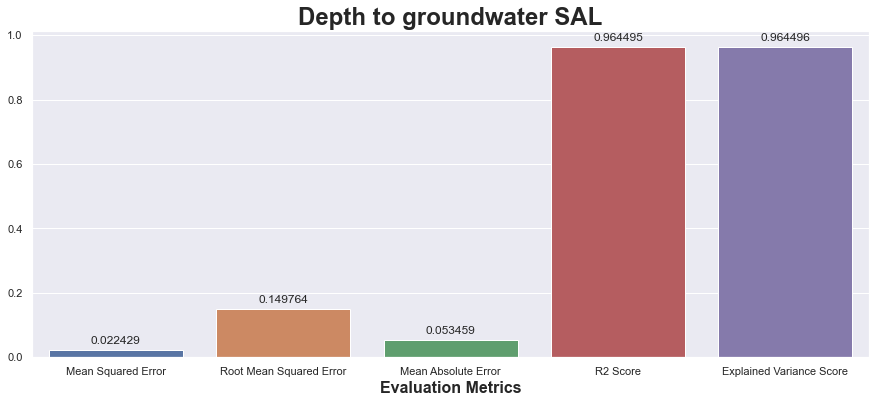

In [58]:
evaluation_barplot(RS_eval, "Depth to groundwater SAL")

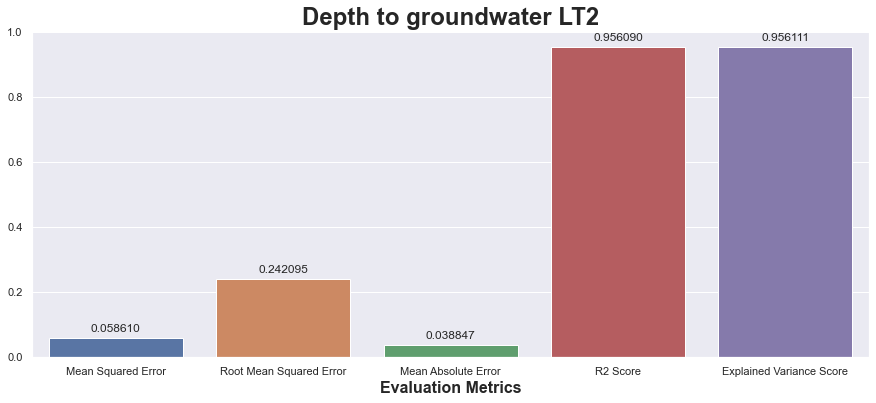

In [59]:
evaluation_barplot(RS_eval2, "Depth to groundwater LT2")

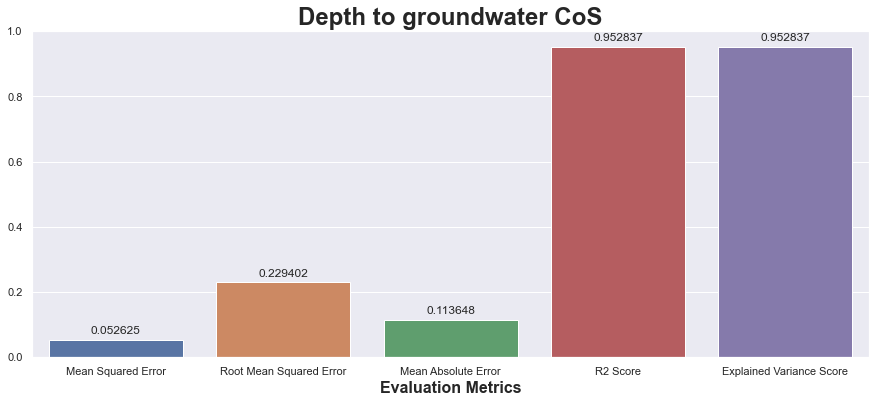

In [60]:
evaluation_barplot(RS_eval3, "Depth to groundwater CoS")